# Point Cloud Classification with PointNet

In [1]:
#pip install trimesh
import os
import glob
import trimesh
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from matplotlib import pyplot as plt

tf.random.set_seed(1234)

In [ ]:
# Use hardware accelerator for training
# physical_devices = tf.config.experimental.list_physical_devices('GPU')
# print("GPUs Available: ", len(physical_devices))
# tf.config.experimental.set_memory_growth(physical_devices[0], True)

## Download the Dataset

In [3]:
#Do not run if the data files are already downloaded
# #DATA_DIR = tf.keras.utils.get_file(
#     "modelnet.zip",
#     "http://3dvision.princeton.edu/projects/2014/3DShapeNets/ModelNet10.zip",
#     extract=True,
# )
# DATA_DIR = os.path.join(os.path.dirname(DATA_DIR), "ModelNet10")

473402300/473402300 [==============================] - 100s 0us/step


## Visualize a Mesh from the Dataset

In [2]:
DATA_DIR = 'C:/Users/duytr/OneDrive - OsloMet/ACIT4030_GroupWork_3D-Image/04.Dataset/Modelnet40/ModelNet40/'
mesh = trimesh.load(os.path.join(DATA_DIR, "curtain/train/curtain_0094.off"))
mesh.show()

## Sample a Mesh and Show Result

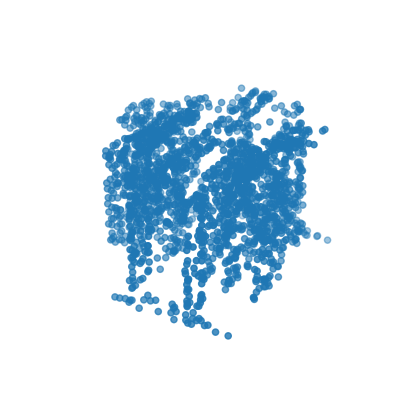

In [3]:
points = mesh.sample(2048)

fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(points[:, 0], points[:, 1], points[:, 2])
ax.set_axis_off()
plt.show()

## Function to Parse Data
- Each mesh is loaded and sampled into a point cloud and is returned as a numpy array

In [4]:
def parse_dataset(num_points=2048):

    train_points = []
    train_labels = []
    test_points = []
    test_labels = []
    class_map = {}
    folders = glob.glob(os.path.join(DATA_DIR, "*"))

    for i, folder in enumerate(folders):
        print("processing class: {}".format(os.path.basename(folder)))
        # store folder name with ID so we can retrieve later
        class_map[i] = os.path.basename(folder)
        # gather all files
        train_files = glob.glob(os.path.join(folder, "train/*"))
        test_files = glob.glob(os.path.join(folder, "test/*"))

        for f in train_files:
            train_points.append(trimesh.load(f).sample(num_points))
            train_labels.append(i)

        for f in test_files:
            test_points.append(trimesh.load(f).sample(num_points))
            test_labels.append(i)

    return (
        np.array(train_points),
        np.array(test_points),
        np.array(train_labels),
        np.array(test_labels),
        class_map,
    )

## Parse the Dataset and Process each Class

In [5]:
NUM_POINTS = 2048
NUM_CLASSES = 40
BATCH_SIZE = 32

train_points, test_points, train_labels, test_labels, CLASS_MAP = parse_dataset(NUM_POINTS)

processing class: airplane
processing class: bathtub
processing class: bed
processing class: bench
processing class: bookshelf
processing class: bottle
processing class: bowl
processing class: car
processing class: chair
processing class: cone
processing class: cup
processing class: curtain


c:\Users\duytr\AppData\Local\Programs\Python\Python311\Lib\site-packages\trimesh\grouping.py:99: RuntimeWarning: invalid value encountered in cast
  stacked = np.column_stack(stacked).round().astype(np.int64)


processing class: desk
processing class: door
processing class: dresser
processing class: flower_pot
processing class: glass_box
processing class: guitar
processing class: keyboard
processing class: lamp
processing class: laptop
processing class: mantel
processing class: monitor
processing class: night_stand
processing class: person
processing class: piano
processing class: plant
processing class: radio
processing class: range_hood
processing class: sink
processing class: sofa
processing class: stairs
processing class: stool
processing class: table
processing class: tent
processing class: toilet
processing class: tv_stand
processing class: vase
processing class: wardrobe
processing class: xbox


In [6]:
from collections import Counter

# Print class labels and the number of samples per class
class_counts = Counter(train_labels)
for class_id, count in class_counts.items():
    print(f"Class {class_id} ({CLASS_MAP[class_id]}): {count} train samples")
print("/n")
class_counts = Counter(test_labels)
for class_id, count in class_counts.items():
    print(f"Class {class_id} ({CLASS_MAP[class_id]}): {count} test samples")

Class 0 (airplane): 626 train samples
Class 1 (bathtub): 106 train samples
Class 2 (bed): 515 train samples
Class 3 (bench): 173 train samples
Class 4 (bookshelf): 572 train samples
Class 5 (bottle): 335 train samples
Class 6 (bowl): 64 train samples
Class 7 (car): 197 train samples
Class 8 (chair): 889 train samples
Class 9 (cone): 167 train samples
Class 10 (cup): 79 train samples
Class 11 (curtain): 137 train samples
Class 12 (desk): 200 train samples
Class 13 (door): 109 train samples
Class 14 (dresser): 200 train samples
Class 15 (flower_pot): 149 train samples
Class 16 (glass_box): 171 train samples
Class 17 (guitar): 155 train samples
Class 18 (keyboard): 145 train samples
Class 19 (lamp): 124 train samples
Class 20 (laptop): 149 train samples
Class 21 (mantel): 284 train samples
Class 22 (monitor): 465 train samples
Class 23 (night_stand): 200 train samples
Class 24 (person): 88 train samples
Class 25 (piano): 231 train samples
Class 26 (plant): 240 train samples
Class 27 (radi

## Augenmentation for Train Dataset

In [7]:
def augment(points, label):
    # jitter points
    points += tf.random.uniform(points.shape, -0.005, 0.005, dtype=tf.float64)
    # shuffle points
    points = tf.random.shuffle(points)
    return points, label


train_dataset = tf.data.Dataset.from_tensor_slices((train_points, train_labels))
test_dataset = tf.data.Dataset.from_tensor_slices((test_points, test_labels))

train_dataset = train_dataset.shuffle(len(train_points)).map(augment).batch(BATCH_SIZE)
test_dataset = test_dataset.shuffle(len(test_points)).batch(BATCH_SIZE)

## Save and Load train/test variables

In [8]:
#Save train/test variables
# Specify a directory path to save the files
save_directory = "C:/Users/duytr/OneDrive - OsloMet/ACIT4030_GroupWork_3D-Image/10.Train-Test_Variables/02.ModelNet40/04.Epoch_40/"

# Save train and test datasets to the specified directory
np.save(save_directory + 'train_points.npy', train_points)
np.save(save_directory + 'test_points.npy', test_points)
np.save(save_directory + 'train_labels.npy', train_labels)
np.save(save_directory + 'test_labels.npy', test_labels)
np.save(save_directory + 'class_map.npy', CLASS_MAP)

In [ ]:
# # Load train/test variables

# NUM_POINTS = 2048
# NUM_CLASSES = 40
# BATCH_SIZE = 32

# # Specify the directory path where the saved files are located
# load_directory = "C:/Users/duytr/OneDrive - OsloMet/ACIT4030_GroupWork_3D-Image/10.Train-Test_Variables/02.ModelNet40/01.Epoch_1/"

# # Load the saved datasets
# train_points = np.load(load_directory + 'train_points.npy')
# test_points = np.load(load_directory + 'test_points.npy')
# train_labels = np.load(load_directory + 'train_labels.npy')
# test_labels = np.load(load_directory + 'test_labels.npy')
# CLASS_MAP = np.load(load_directory + 'class_map.npy', allow_pickle=True).item()


# def augment(points, label):
#     # jitter points
#     points += tf.random.uniform(points.shape, -0.005, 0.005, dtype=tf.float64)
#     # shuffle points
#     points = tf.random.shuffle(points)
#     return points, label

# #Convert train/test_points to train/test_dataset
# train_dataset = tf.data.Dataset.from_tensor_slices((train_points, train_labels))
# test_dataset = tf.data.Dataset.from_tensor_slices((test_points, test_labels))

# train_dataset = train_dataset.shuffle(len(train_points)).map(augment).batch(BATCH_SIZE)
# test_dataset = test_dataset.shuffle(len(test_points)).batch(BATCH_SIZE)

## Functions to Build the Model

In [9]:
def conv_bn(x, filters):
    x = layers.Conv1D(filters, kernel_size=1, padding="valid")(x)
    x = layers.BatchNormalization(momentum=0.0)(x)
    return layers.Activation("relu")(x)


def dense_bn(x, filters):
    x = layers.Dense(filters)(x)
    x = layers.BatchNormalization(momentum=0.0)(x)
    return layers.Activation("relu")(x)

## Function to create T-net Layers

In [10]:
def tnet(inputs, num_features):

    # Initalise bias as the indentity matrix
    bias = keras.initializers.Constant(np.eye(num_features).flatten())
    #reg = OrthogonalRegularizer(num_features)

    x = conv_bn(inputs, 32)
    x = conv_bn(x, 64)
    x = conv_bn(x, 512)
    x = layers.GlobalMaxPooling1D()(x)
    x = dense_bn(x, 256)
    x = dense_bn(x, 128)
    x = layers.Dense(
        num_features * num_features,
        kernel_initializer="zeros",
        bias_initializer=bias,
        #activity_regularizer=reg,
    )(x)
    feat_T = layers.Reshape((num_features, num_features))(x)
    # Apply affine transformation to input features
    return layers.Dot(axes=(2, 1))([inputs, feat_T])

## Create the Convolutional Neural Network

In [11]:
inputs = keras.Input(shape=(NUM_POINTS, 3))

x = tnet(inputs, 3)
x = conv_bn(x, 32)
x = conv_bn(x, 32)
x = tnet(x, 32)
x = conv_bn(x, 32)
x = conv_bn(x, 64)
x = conv_bn(x, 512)
x = layers.GlobalMaxPooling1D()(x)
x = dense_bn(x, 256)
x = layers.Dropout(0.3)(x)
x = dense_bn(x, 128)
x = layers.Dropout(0.3)(x)

outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)

model = keras.Model(inputs=inputs, outputs=outputs, name="pointnet")
model.summary()

Model: "pointnet"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 2048, 3)]            0         []                            
                                                                                                  
 conv1d (Conv1D)             (None, 2048, 32)             128       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 2048, 32)             128       ['conv1d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 2048, 32)             0         ['batch_normalization[0

## Compile and Train the Model

In [12]:
model.compile(
    loss="sparse_categorical_crossentropy",
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    metrics=["sparse_categorical_accuracy"],
)

history = model.fit(train_dataset, epochs=40, validation_data=test_dataset)

Epoch 1/40
308/308 [==============================] - 358s 1s/step - loss: 3.5311 - sparse_categorical_accuracy: 0.1130 - val_loss: 43959.6211 - val_sparse_categorical_accuracy: 0.0823
Epoch 2/40
308/308 [==============================] - 352s 1s/step - loss: 3.1943 - sparse_categorical_accuracy: 0.1740 - val_loss: 164642848768.0000 - val_sparse_categorical_accuracy: 0.1576
Epoch 3/40
308/308 [==============================] - 348s 1s/step - loss: 2.8997 - sparse_categorical_accuracy: 0.2148 - val_loss: 214547185664.0000 - val_sparse_categorical_accuracy: 0.1844
Epoch 4/40
308/308 [==============================] - 348s 1s/step - loss: 2.7346 - sparse_categorical_accuracy: 0.2489 - val_loss: 30604304384.0000 - val_sparse_categorical_accuracy: 0.2058
Epoch 5/40
308/308 [==============================] - 355s 1s/step - loss: 2.5728 - sparse_categorical_accuracy: 0.2811 - val_loss: 972997263360.0000 - val_sparse_categorical_accuracy: 0.2229
Epoch 6/40
308/308 [============================

## Save and Load Trained Model

In [13]:
#Save the trained model
output_dir = 'C:/Users/duytr/OneDrive - OsloMet/ACIT4030_GroupWork_3D-Image/09.Trained_Models/02.ModelNet40/04.Epoch_40'
# Save the trained model in the output directory

model.save(os.path.join(output_dir, "cnn_model_d071123_epoch40.keras"))

In [27]:
print(type(history))

<class 'keras.src.callbacks.History'>


In [4]:
# Load the trained model with a custom object scope
output_dir = "C:/Users/zihad/OneDrive - OsloMet/ACIT4030_GroupWork_3D-Image/09.Trained_Models/02.ModelNet40/04.Epoch_40"
model_path = os.path.join(output_dir, "cnn_model_d071123_epoch40.keras")
model = keras.models.load_model(model_path)

In [8]:
# Load train/test variables

NUM_POINTS = 2048
NUM_CLASSES = 40
BATCH_SIZE = 32

# Specify the directory path where the saved files are located
load_directory = "C:/Users/zihad/OneDrive - OsloMet/ACIT4030_GroupWork_3D-Image/10.Train-Test_Variables/02.ModelNet40/04.Epoch_40/"

# Load the saved datasets
train_points = np.load(load_directory + 'train_points.npy')
test_points = np.load(load_directory + 'test_points.npy')
train_labels = np.load(load_directory + 'train_labels.npy')
test_labels = np.load(load_directory + 'test_labels.npy')
CLASS_MAP = np.load(load_directory + 'class_map.npy', allow_pickle=True).item()


def augment(points, label):
    # jitter points
    points += tf.random.uniform(points.shape, -0.005, 0.005, dtype=tf.float64)
    # shuffle points
    points = tf.random.shuffle(points)
    return points, label

#Convert train/test_points to train/test_dataset
train_dataset = tf.data.Dataset.from_tensor_slices((train_points, train_labels))
test_dataset = tf.data.Dataset.from_tensor_slices((test_points, test_labels))

train_dataset = train_dataset.shuffle(len(train_points)).map(augment).batch(BATCH_SIZE)
test_dataset = test_dataset.shuffle(len(test_points)).batch(BATCH_SIZE)

## Visualize The Predictions

1/1 [==============================] - 0s 60ms/step


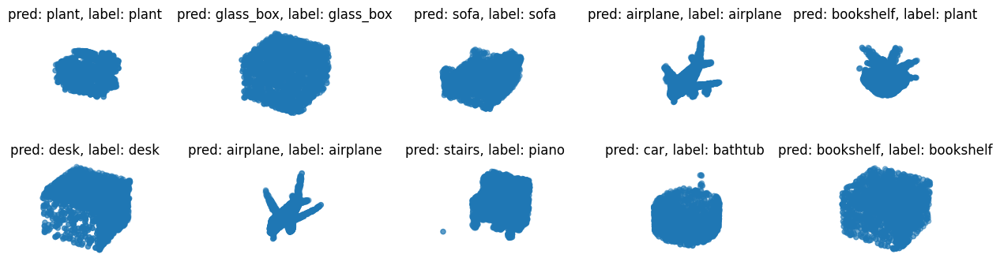

In [13]:
data = test_dataset.take(10)

points, labels = list(data)[0]
points = points[:10, ...]
labels = labels[:10, ...]

# run test data through model
preds = model.predict(points)
preds = tf.math.argmax(preds, -1)

points = points.numpy()

# plot points with predicted class and label
fig = plt.figure(figsize=(15.25, 4.1))  # Set figsize to match the desired size in inches
fig.subplots_adjust(wspace=0.5)  # Adjust the horizontal space between subplots
for i in range(10):
    ax = fig.add_subplot(2, 5, i + 1, projection="3d")
    ax.scatter(points[i, :, 0], points[i, :, 1], points[i, :, 2])
    ax.set_title(
        "pred: {:}, label: {:}".format(
            CLASS_MAP[preds[i].numpy()], CLASS_MAP[labels.numpy()[i]]
        ),
        y=1
    )
    ax.set_axis_off()

# Save the figure with the specified size and dpi
save_filename = 'Train-Test_Prediction_Epoch_40_7.png'
save_path = os.path.join(output_dir, save_filename)
dpi = 600  # Set dpi to 600
plt.savefig(save_path, dpi=dpi, bbox_inches='tight')  # Use bbox_inches='tight' to prevent cropping
plt.show()

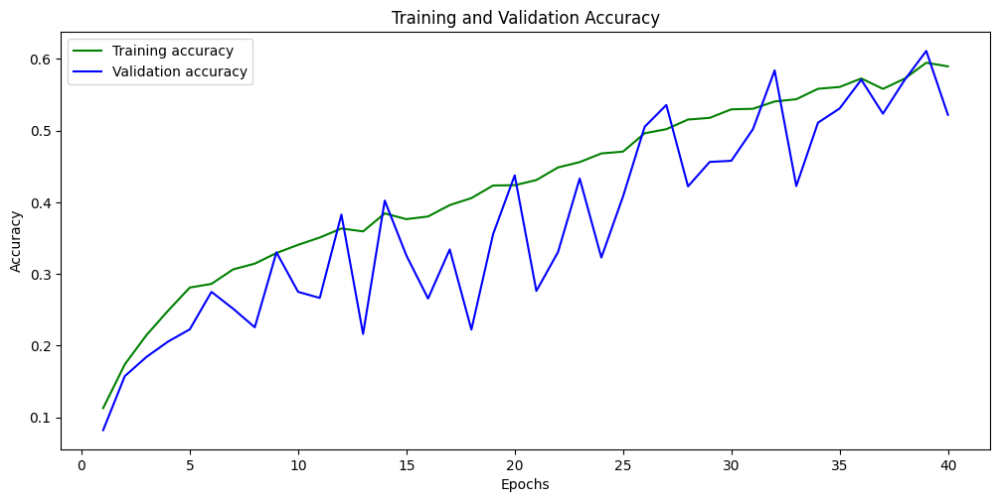

In [22]:
#Accuracy Chart
#########################
# Assuming you have the history object from model training
# history = model.fit(...) or history = load_model('your_model.h5')

plt.figure(figsize=(10, 5))

# Plot training and validation accuracy
plt.subplot(1, 1, 1)
train_acc = history.history['sparse_categorical_accuracy']
val_acc = history.history['val_sparse_categorical_accuracy']
epochs = range(1, len(train_acc) + 1)

plt.plot(epochs, train_acc, 'g', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.tight_layout(pad=0.5)
save_filename = 'Train-Validation_Accuracy_Epoch_40.png'
save_path = os.path.join(output_dir, save_filename)
dpi=600
plt.savefig(save_path, dpi=dpi)
plt.show()

In [23]:
# Assuming you have already trained your model and have the 'history' object
if 'sparse_categorical_accuracy' in history.history and 'val_sparse_categorical_accuracy' in history.history:
    train_acc = history.history['sparse_categorical_accuracy']
    val_acc = history.history['val_sparse_categorical_accuracy']
    
    # Check if data is present
    print(history.history.keys())  # To see all available metrics
    print(train_acc)
    print(val_acc)
    print(history.history['loss'])
    print(history.history['val_loss'])

    # Rest of your plotting code here
else:
    print("Accuracy data not found in history. Check your metric names or training process.")


dict_keys(['loss', 'sparse_categorical_accuracy', 'val_loss', 'val_sparse_categorical_accuracy'])
[0.11298516392707825, 0.1740499883890152, 0.21479374170303345, 0.24893313646316528, 0.28114205598831177, 0.28622230887413025, 0.3064417839050293, 0.3144685924053192, 0.3292013704776764, 0.3406827747821808, 0.35084331035614014, 0.36344239115715027, 0.3593781888484955, 0.3844746947288513, 0.3764478862285614, 0.38020727038383484, 0.39605772495269775, 0.4058118164539337, 0.4233895540237427, 0.4237959682941437, 0.4310099482536316, 0.44858768582344055, 0.45600488781929016, 0.46809592843055725, 0.4706360399723053, 0.49624061584472656, 0.5019304752349854, 0.5153424143791199, 0.5176793336868286, 0.5295671820640564, 0.5303800106048584, 0.5405405163764954, 0.5436903238296509, 0.558219850063324, 0.5607600212097168, 0.5726478099822998, 0.5581182837486267, 0.5723429918289185, 0.5945945978164673, 0.5895143151283264]
[0.08225283771753311, 0.1576175093650818, 0.18435980379581451, 0.20583468675613403, 0.222

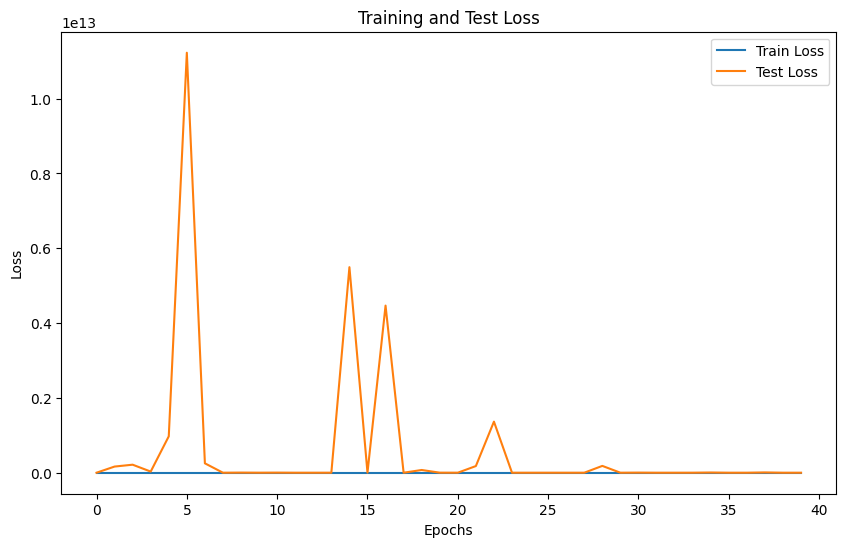

In [24]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
train_loss = history.history['loss']
test_loss = history.history['val_loss']
 
# Plot the training and test loss
plt.figure(figsize=(10, 6))
plt.plot(train_loss, label='Train Loss')
plt.plot(test_loss, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Test Loss')
plt.show()